In [1]:
# basic operations
import numpy as np

# for dataframe manipulations
import pandas as pd 

# for data visualizations
import matplotlib.pyplot as plt
import seaborn as sns

import plotly.graph_objs as go
from plotly.offline import iplot, init_notebook_mode


In [2]:
# reading the data and also checking the computation time
data = pd.read_csv('data.csv')

# lets also check the shape of the dataset
print(data.shape)

(18207, 89)


In [3]:
# lets check the column names present in the data
data.columns

Index(['Unnamed: 0', 'ID', 'Name', 'Age', 'Photo', 'Nationality', 'Flag',
       'Overall', 'Potential', 'Club', 'Club Logo', 'Value', 'Wage', 'Special',
       'Preferred Foot', 'International Reputation', 'Weak Foot',
       'Skill Moves', 'Work Rate', 'Body Type', 'Real Face', 'Position',
       'Jersey Number', 'Joined', 'Loaned From', 'Contract Valid Until',
       'Height', 'Weight', 'LS', 'ST', 'RS', 'LW', 'LF', 'CF', 'RF', 'RW',
       'LAM', 'CAM', 'RAM', 'LM', 'LCM', 'CM', 'RCM', 'RM', 'LWB', 'LDM',
       'CDM', 'RDM', 'RWB', 'LB', 'LCB', 'CB', 'RCB', 'RB', 'Crossing',
       'Finishing', 'HeadingAccuracy', 'ShortPassing', 'Volleys', 'Dribbling',
       'Curve', 'FKAccuracy', 'LongPassing', 'BallControl', 'Acceleration',
       'SprintSpeed', 'Agility', 'Reactions', 'Balance', 'ShotPower',
       'Jumping', 'Stamina', 'Strength', 'LongShots', 'Aggression',
       'Interceptions', 'Positioning', 'Vision', 'Penalties', 'Composure',
       'Marking', 'StandingTackle', 'SlidingT

In [4]:
data.head()

,Unnamed: 0,ID,Name,Age,Photo,Nationality,Flag,Overall,Potential,Club,...,Composure,Marking,StandingTackle,SlidingTackle,GKDiving,GKHandling,GKKicking,GKPositioning,GKReflexes,Release Clause
0,0,158023,L. Messi,31,https://cdn.sofifa.org/players/4/19/158023.png,Argentina,https://cdn.sofifa.org/flags/52.png,94,94,FC Barcelona,...,96.0,33.0,28.0,26.0,6.0,11.0,15.0,14.0,8.0,€226.5M
1,1,20801,Cristiano Ronaldo,33,https://cdn.sofifa.org/players/4/19/20801.png,Portugal,https://cdn.sofifa.org/flags/38.png,94,94,Juventus,...,95.0,28.0,31.0,23.0,7.0,11.0,15.0,14.0,11.0,€127.1M
2,2,190871,Neymar Jr,26,https://cdn.sofifa.org/players/4/19/190871.png,Brazil,https://cdn.sofifa.org/flags/54.png,92,93,Paris Saint-Germain,...,94.0,27.0,24.0,33.0,9.0,9.0,15.0,15.0,11.0,€228.1M
3,3,193080,De Gea,27,https://cdn.sofifa.org/players/4/19/193080.png,Spain,https://cdn.sofifa.org/flags/45.png,91,93,Manchester United,...,68.0,15.0,21.0,13.0,90.0,85.0,87.0,88.0,94.0,€138.6M
4,4,192985,K. De Bruyne,27,https://cdn.sofifa.org/players/4/19/192985.png,Belgium,https://cdn.sofifa.org/flags/7.png,91,92,Manchester City,...,88.0,68.0,58.0,51.0,15.0,13.0,5.0,10.0,13.0,€196.4M


In [5]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18207 entries, 0 to 18206
Data columns (total 89 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Unnamed: 0                18207 non-null  int64  
 1   ID                        18207 non-null  int64  
 2   Name                      18207 non-null  object 
 3   Age                       18207 non-null  int64  
 4   Photo                     18207 non-null  object 
 5   Nationality               18207 non-null  object 
 6   Flag                      18207 non-null  object 
 7   Overall                   18207 non-null  int64  
 8   Potential                 18207 non-null  int64  
 9   Club                      17966 non-null  object 
 10  Club Logo                 18207 non-null  object 
 11  Value                     18207 non-null  object 
 12  Wage                      18207 non-null  object 
 13  Special                   18207 non-null  int64  
 14  Prefer

##  Imputing Missing Values

In [6]:
# delete umwanted columns 
data.drop(["Photo","Club Logo","Flag","ID","Unnamed: 0","Loaned From"], axis = 1, inplace= True)

In [7]:
# check for empty cells
for col_name in data.columns:
    print(col_name+" ", data[col_name].isna().sum())

Name  0
Age  0
Nationality  0
Overall  0
Potential  0
Club  241
Value  0
Wage  0
Special  0
Preferred Foot  48
International Reputation  48
Weak Foot  48
Skill Moves  48
Work Rate  48
Body Type  48
Real Face  48
Position  60
Jersey Number  60
Joined  1553
Contract Valid Until  289
Height  48
Weight  48
LS  2085
ST  2085
RS  2085
LW  2085
LF  2085
CF  2085
RF  2085
RW  2085
LAM  2085
CAM  2085
RAM  2085
LM  2085
LCM  2085
CM  2085
RCM  2085
RM  2085
LWB  2085
LDM  2085
CDM  2085
RDM  2085
RWB  2085
LB  2085
LCB  2085
CB  2085
RCB  2085
RB  2085
Crossing  48
Finishing  48
HeadingAccuracy  48
ShortPassing  48
Volleys  48
Dribbling  48
Curve  48
FKAccuracy  48
LongPassing  48
BallControl  48
Acceleration  48
SprintSpeed  48
Agility  48
Reactions  48
Balance  48
ShotPower  48
Jumping  48
Stamina  48
Strength  48
LongShots  48
Aggression  48
Interceptions  48
Positioning  48
Vision  48
Penalties  48
Composure  48
Marking  48
StandingTackle  48
SlidingTackle  48
GKDiving  48
GKHandling  48
GK

In [8]:
## let's Drop rows with empty cells

data.dropna(axis=0,inplace=True)

In [9]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 14743 entries, 0 to 18206
Data columns (total 83 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Name                      14743 non-null  object 
 1   Age                       14743 non-null  int64  
 2   Nationality               14743 non-null  object 
 3   Overall                   14743 non-null  int64  
 4   Potential                 14743 non-null  int64  
 5   Club                      14743 non-null  object 
 6   Value                     14743 non-null  object 
 7   Wage                      14743 non-null  object 
 8   Special                   14743 non-null  int64  
 9   Preferred Foot            14743 non-null  object 
 10  International Reputation  14743 non-null  float64
 11  Weak Foot                 14743 non-null  float64
 12  Skill Moves               14743 non-null  float64
 13  Work Rate                 14743 non-null  object 
 14  Body T

In [10]:
data.shape

(14743, 83)

## Grouping

In [11]:
# FEATURE ENGINEERING
# creating new features by aggregating the features

def defending(data):
    return int(round((data[['Marking', 'StandingTackle', 
                               'SlidingTackle']].mean()).mean()))

def general(data):
    return int(round((data[['HeadingAccuracy', 'Dribbling', 'Curve', 
                               'BallControl']].mean()).mean()))

def mental(data):
    return int(round((data[['Aggression', 'Interceptions', 'Positioning', 
                               'Vision','Composure']].mean()).mean()))

def passing(data):
    return int(round((data[['Crossing', 'ShortPassing', 
                               'LongPassing']].mean()).mean()))

def mobility(data):
    return int(round((data[['Acceleration', 'SprintSpeed', 
                               'Agility','Reactions']].mean()).mean()))
def power(data):
    return int(round((data[['Balance', 'Jumping', 'Stamina', 
                               'Strength']].mean()).mean()))

def rating(data):
    return int(round((data[['Potential', 'Overall']].mean()).mean()))

def shooting(data):
    return int(round((data[['Finishing', 'Volleys', 'FKAccuracy', 
                               'ShotPower','LongShots', 'Penalties']].mean()).mean()))

def goalkeeping(data):
    return int(round((data[['GKDiving', 'GKHandling', 'GKKicking', 
                            'GKPositioning', 'GKReflexes']].mean()).mean()))

In [12]:
# adding these categories to the data

data['Defending'] = data.apply(defending, axis = 1)
data['General'] = data.apply(general, axis = 1)
data['Mental'] = data.apply(mental, axis = 1)
data['Passing'] = data.apply(passing, axis = 1)
data['Mobility'] = data.apply(mobility, axis = 1)
data['Power'] = data.apply(power, axis = 1)
data['Rating'] = data.apply(rating, axis = 1)
data['Shooting'] = data.apply(shooting, axis = 1)
data['Goalkeeping'] = data.apply(goalkeeping, axis = 1)

# lets check the column names in the data after adding new features
data.columns

Index(['Name', 'Age', 'Nationality', 'Overall', 'Potential', 'Club', 'Value',
       'Wage', 'Special', 'Preferred Foot', 'International Reputation',
       'Weak Foot', 'Skill Moves', 'Work Rate', 'Body Type', 'Real Face',
       'Position', 'Jersey Number', 'Joined', 'Contract Valid Until', 'Height',
       'Weight', 'LS', 'ST', 'RS', 'LW', 'LF', 'CF', 'RF', 'RW', 'LAM', 'CAM',
       'RAM', 'LM', 'LCM', 'CM', 'RCM', 'RM', 'LWB', 'LDM', 'CDM', 'RDM',
       'RWB', 'LB', 'LCB', 'CB', 'RCB', 'RB', 'Crossing', 'Finishing',
       'HeadingAccuracy', 'ShortPassing', 'Volleys', 'Dribbling', 'Curve',
       'FKAccuracy', 'LongPassing', 'BallControl', 'Acceleration',
       'SprintSpeed', 'Agility', 'Reactions', 'Balance', 'ShotPower',
       'Jumping', 'Stamina', 'Strength', 'LongShots', 'Aggression',
       'Interceptions', 'Positioning', 'Vision', 'Penalties', 'Composure',
       'Marking', 'StandingTackle', 'SlidingTackle', 'GKDiving', 'GKHandling',
       'GKKicking', 'GKPositioning', '

## Dropping Features

Now we have transformed So we should safely drop the variables that we think would not be useful anymore

In [13]:
'''Drop the features that would not be useful anymore.'''
data.drop(columns = ['Crossing', 'Finishing', 'HeadingAccuracy',
                     'ShortPassing', 'Volleys', 'Dribbling', 'Curve', 'FKAccuracy',
                     'LongPassing', 'BallControl', 'Acceleration', 'SprintSpeed',
                     'Agility', 'Reactions', 'Balance', 'ShotPower', 'Jumping',
                     'Stamina', 'Strength', 'LongShots', 'Aggression', 'Interceptions',
                     'Positioning', 'Vision', 'Penalties', 'Composure', 'Marking',
                     'StandingTackle', 'SlidingTackle', 'GKDiving', 'GKHandling',
                     'GKKicking', 'GKPositioning', 'GKReflexes', 'Overall', 'Potential'], inplace = True, axis =1)
'''Features Remaining after Dropping:'''
data.columns

Index(['Name', 'Age', 'Nationality', 'Club', 'Value', 'Wage', 'Special',
       'Preferred Foot', 'International Reputation', 'Weak Foot',
       'Skill Moves', 'Work Rate', 'Body Type', 'Real Face', 'Position',
       'Jersey Number', 'Joined', 'Contract Valid Until', 'Height', 'Weight',
       'LS', 'ST', 'RS', 'LW', 'LF', 'CF', 'RF', 'RW', 'LAM', 'CAM', 'RAM',
       'LM', 'LCM', 'CM', 'RCM', 'RM', 'LWB', 'LDM', 'CDM', 'RDM', 'RWB', 'LB',
       'LCB', 'CB', 'RCB', 'RB', 'Release Clause', 'Defending', 'General',
       'Mental', 'Passing', 'Mobility', 'Power', 'Rating', 'Shooting',
       'Goalkeeping'],
      dtype='object')

## Data Preprocessing

In [14]:
#All the player weights are mentioned in lbs and is object type. We will remove the postfix and convert it into int column.

data['Weight'] = data['Weight'].apply(lambda x : x[:-3])
data['Weight'] = data['Weight'].astype('int64')
data['Weight'].head(5)

0    159
1    183
2    150
4    154
5    163
Name: Weight, dtype: int64

In [15]:
# defining a function for cleaning the wage and Value column

def clean(column):
    out = column.replace('€', '')
    if 'M' in out:
        out = float(out.replace('M', ''))*1000000
    elif 'K' in column:
        out = float(out.replace('K', ''))*1000
    return int(out)
data['Wage'] = data['Wage'].apply(lambda x: clean(str(x)))
data['Value'] = data['Value'].apply(lambda x: clean(str(x)))
display(data[['Weight', 'Height', 'Value', 'Wage']].head(3))


,Weight,Height,Value,Wage
0,159,5'7,110500000,565000
1,183,6'2,77000000,405000
2,150,5'9,118500000,290000


## Data Visualization

C:\Users\hp\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).

C:\Users\hp\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).

C:\Users\hp\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).

C:\Users\hp\anaconda3\lib\site-packages\seabor

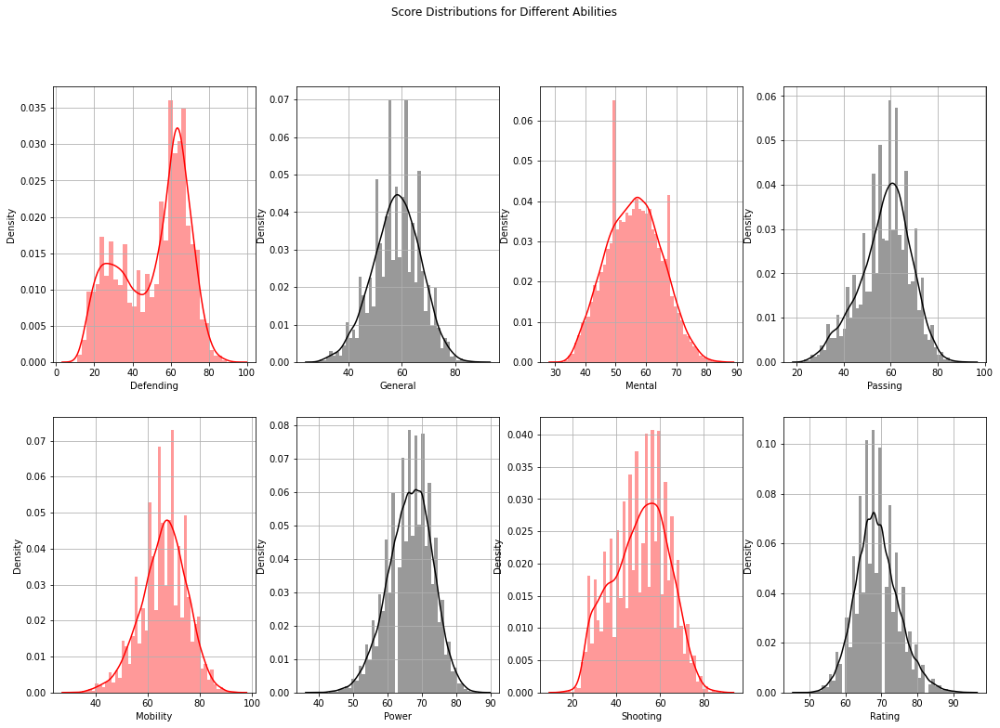

In [16]:
# lets check the Distribution of Scores of Different Skills

plt.rcParams['figure.figsize'] = (18, 12)
plt.subplot(2, 4, 1)
sns.distplot(data['Defending'], color = 'red')
plt.grid()

plt.subplot(2, 4, 2)
sns.distplot(data['General'], color = 'black')
plt.grid()

plt.subplot(2, 4, 3)
sns.distplot(data['Mental'], color = 'red')
plt.grid()

plt.subplot(2, 4, 4)
sns.distplot(data['Passing'], color = 'black')
plt.grid()

plt.subplot(2, 4, 5)
sns.distplot(data['Mobility'], color = 'red')
plt.grid()

plt.subplot(2, 4, 6)
sns.distplot(data['Power'], color = 'black')
plt.grid()

plt.subplot(2, 4, 7)
sns.distplot(data['Shooting'], color = 'red')
plt.grid()

plt.subplot(2, 4, 8)
sns.distplot(data['Rating'], color = 'black')
plt.grid()

plt.suptitle('Score Distributions for Different Abilities')
plt.show()

In [17]:
'''Create the funtion for different plots and visualization'''

'''Function to distribution plot'''
def distplot(variable, color):
    global ax
    font_size = 16
    title_size = 20
    plt.rcParams['figure.figsize'] = (18, 7)
    ax = sns.displot(variable, color = color)
    plt.xlabel('%s' %variable.name, fontsize = font_size)
    plt.ylabel('Count of the Players', fontsize = font_size)
    plt.xticks(fontsize = font_size)
    plt.yticks(fontsize = font_size)
    plt.title('%s' %variable.name + ' Distribution of Players', fontsize = title_size)
    plt.show()
    
    '''Function to count plot'''     
def countplot(variable, title,  color):
    global ax
    font_size = 14
    title_size = 20
    plt.rcParams['figure.figsize'] = (18, 8)
    ax = sns.countplot(variable, palette = color)
    plt.xlabel('%s' %variable.name, fontsize = font_size)
    plt.xticks(fontsize = font_size)
    plt.yticks(fontsize = font_size)
    plt.title(title, fontsize = title_size)
    plt.show()
    
'''Function to pie chart''' 
def piechart(variable, title, color):
    labels = ['1', '2', '3', '4', '5']
    variable = variable.value_counts()
    explode = [0.1, 0.1, 0.2, 0.5, 0.9]
    plt.rcParams['figure.figsize'] = (9, 9)
    plt.pie(variable, labels = labels, colors = color, explode = explode, shadow = True)
    plt.title(title, fontsize = 20)
    plt.legend()
    plt.show()

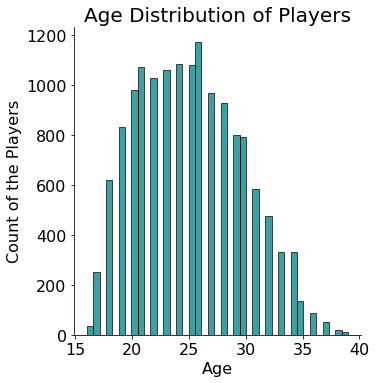

In [18]:
'''Distribution of the Age of the players'''
distplot(data['Age'], 'teal')

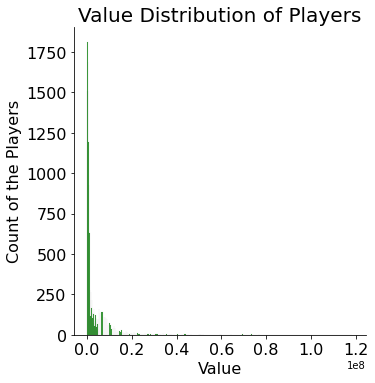

In [19]:
'''Distribution of the value of the players'''
distplot(data['Value'], 'g')

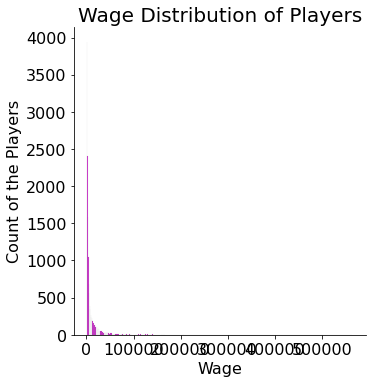

In [20]:
'''Distribution of the wage of the players'''
distplot(data['Wage'], 'm')

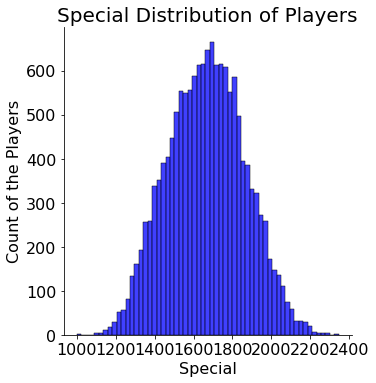

In [21]:
'''Distribution of Speciality Score of the players'''
distplot(data['Special'], 'b')

C:\Users\hp\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



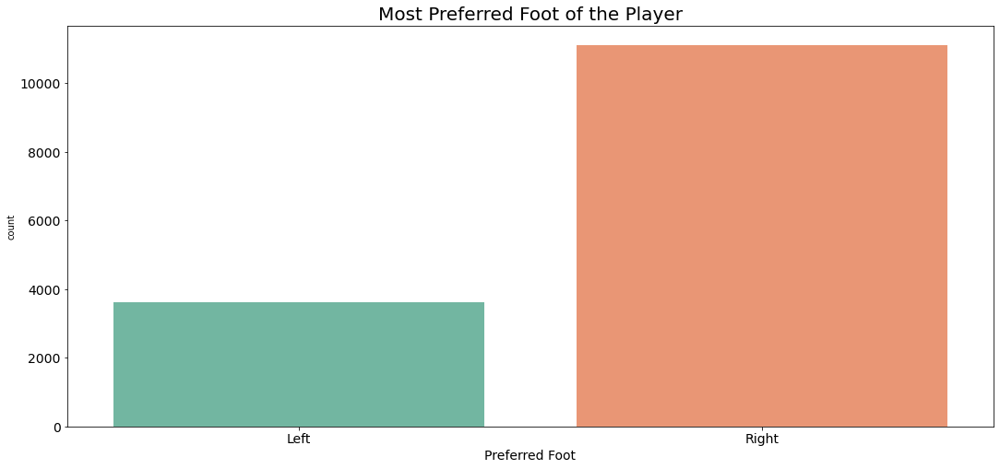

In [22]:
'''comparison of preferred foot over the different players'''
countplot(data['Preferred Foot'], 'Most Preferred Foot of the Player', 'Set2')

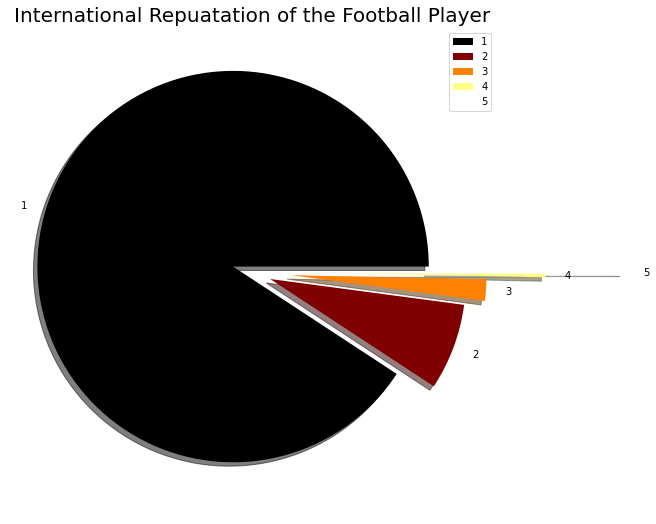

In [23]:
'''Pie chart to represent share of international repuatation'''
piechart(data['International Reputation'], 'International Repuatation of the Football Player', plt.cm.afmhot(np.linspace(0, 1, 5)))

Only few players have high international repuatation.

PLAYER POSITION

C:\Users\hp\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



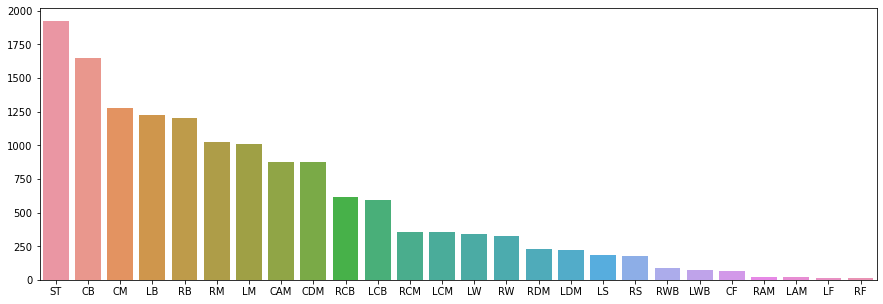

In [24]:
fifa_pos = data['Position'].value_counts()
plt.figure(figsize=(15,5))
sns.barplot(fifa_pos.index,fifa_pos.values)
plt.show()

No of Right forwards in the player set is the least. We can see how many of them are there in this dataset

In [25]:
data.loc[data['Position']=='RF'].count()[0]

13

## Bivariate Analysis

In [26]:
'''Plot regression plot to see how Rating is correlated with numerical variables.'''
corr_num = data.loc[:, ['Value', 'Wage', 'Special', 'Jersey Number', 'Height',
                        'Weight', 'General', 'Mental', 'Mobility', 'Power', 'Shooting',
                         'Passing', 'Defending','Goalkeeping']]
for i in corr_num.columns:
    x = corr_num[i]
    y = data['Rating']
    
    # Creating the dataset and generating the plot
    trace = go.Scatter(
                       x = x,
                       y = y,
                       mode = 'markers',
                       marker = dict(color = 'olive'))
    
    # Layout for regression plot
    title = '{} vs Rating'.format(corr_num[i].name)
    layout = go.Layout(title = title, yaxis = dict(title = 'Rating'))
    
    fig = go.Figure(data = trace, layout = layout)
    iplot(fig)


Most of variables showing positive relationship between 'Rating' and 'Value', 'Wage', 'Special', 'General', 'Mental', 'Mobility', 'Power','Shooting', 'Passing', 'Defending', 'Goalkeeping'. But few of them showing no relationship between 'Rating and 'Jersey Number', 'Height', 'Weight.

In [27]:
'''Create boxplots to see the association between categorical and Rating variables.'''
corr_cat = data.loc[:, ['Preferred Foot', 'International Reputation', 'Weak Foot',
                        'Skill Moves', 'Position']]
for i in corr_cat.columns:
    trace = go.Box(
                   x = corr_cat[i],
                   y = data['Rating'],
                   marker = dict(color = 'teal'))
    layout = go.Layout(title = '{} vs Rating'. format(i), yaxis = dict(title = 'Rating'))
    fig = go.Figure(data = trace, layout = layout)
    iplot(fig)

In [28]:
'''Create bar plot to see the association between 'Name', 'Nationality', 'Club and Rating variables.'''
def bar_plot(x,y, xlabel, ylabel, label, color):
    global ax
    font_size = 16
    title_size = 20
    plt.rcParams['figure.figsize'] = (18, 7)
    ax = sns.barplot(x, y, palette = color)
    ax.set_xlabel(xlabel = xlabel, fontsize = font_size)
    ax.set_ylabel(ylabel = ylabel, fontsize = font_size)
    ax.set_title(label = label, fontsize = font_size)
    plt.show()

In [29]:
'''picking up the countries with highest number of players to compare their Rating scores'''
data['Nationality'].value_counts().head(10)


England        1320
Germany         993
Spain           866
France          757
Argentina       741
Brazil          721
Colombia        520
Italy           493
Japan           395
Netherlands     372
Name: Nationality, dtype: int64

C:\Users\hp\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



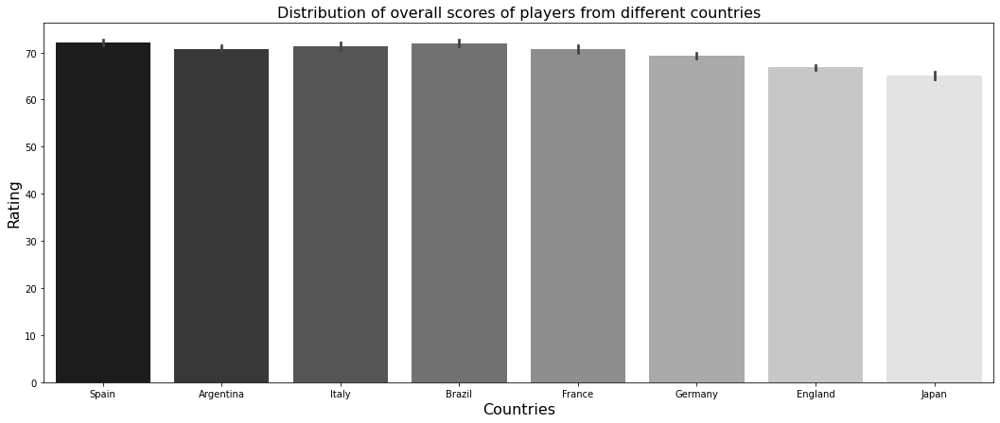

In [30]:
countries = ('England', 'Germany', 'Spain','France', 'Argentina', 'Brazil', 'Columbia', 'Italy', 'Japan', 'Netherlans')
data_countries = data.loc[data['Nationality'].isin(countries) & data['Rating']]

'''Visualization'''
bar_plot(data_countries['Nationality'], data_countries['Rating'], 'Countries', 'Rating',
                    'Distribution of overall scores of players from different countries', 'binary_r')

C:\Users\hp\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



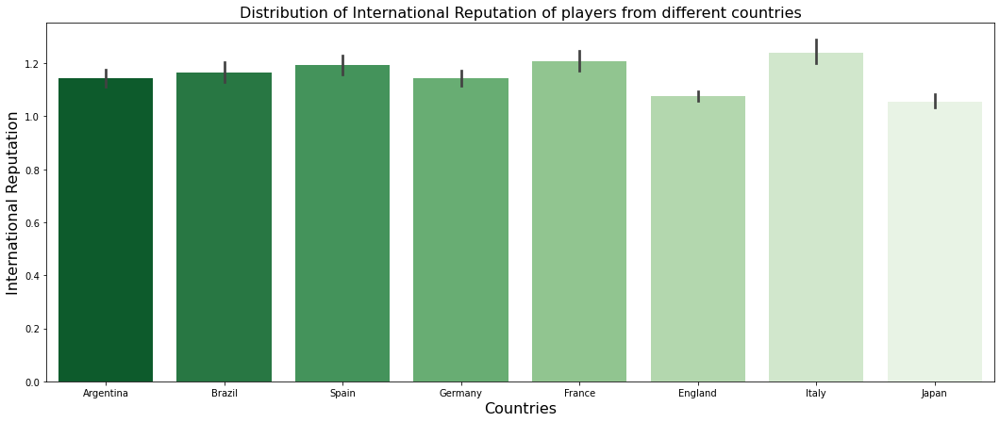

In [31]:
'''Distribution of International Reputation of players from different countries'''

data_countries = data.loc[data['Nationality'].isin(countries) & data['International Reputation']]

'''Visualization'''
bar_plot(data_countries['Nationality'], data_countries['International Reputation'], 'Countries', 'International Reputation',
                    'Distribution of International Reputation of players from different countries', 'Greens_r')



In [32]:
'''Clubs with highest number of players'''
data['Club'].value_counts().head(20)

Arsenal                    30
Liverpool                  30
West Ham United            30
Atlético Madrid            30
Manchester United          30
Brighton & Hove Albion     29
TSG 1899 Hoffenheim        29
Borussia Dortmund          29
Leicester City             29
FC Barcelona               29
Tottenham Hotspur          29
Bournemouth                29
Real Madrid                29
VfL Wolfsburg              29
Manchester City            29
AS Monaco                  29
FC Augsburg                28
RC Celta                   28
Crystal Palace             28
Athletic Club de Bilbao    28
Name: Club, dtype: int64

C:\Users\hp\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



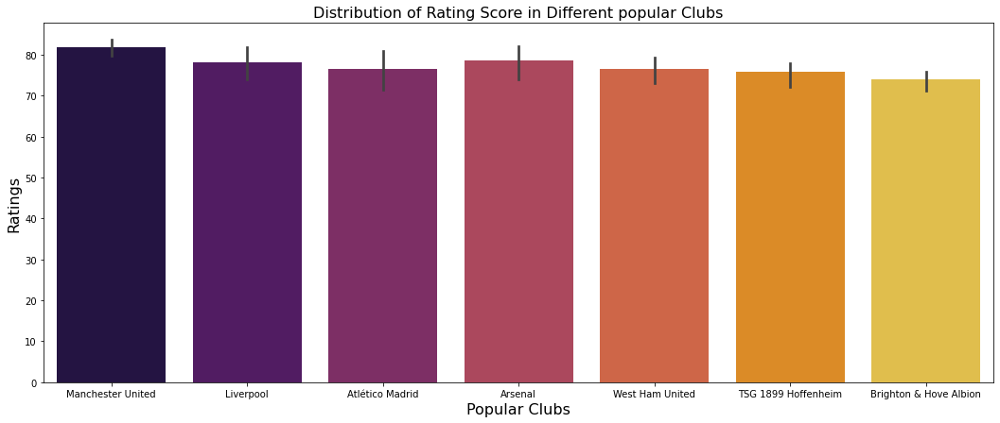

In [33]:
'''Picking up the popular clubs around the globe'''
clubs = ('Arsenal','Liverpool', 'West Ham United', 'Atlético Madrid', 'Manchester United', 'Brighton & Hove Albion',
             'TSG 1899 Hoffenheim')
data_clubs = data.loc[data['Club'].isin(clubs) & data['Rating']]

'''Visualization'''
bar_plot(data_clubs['Club'], data_clubs['Rating'], 'Popular Clubs','Ratings',
                'Distribution of Rating Score in Different popular Clubs', 'inferno')

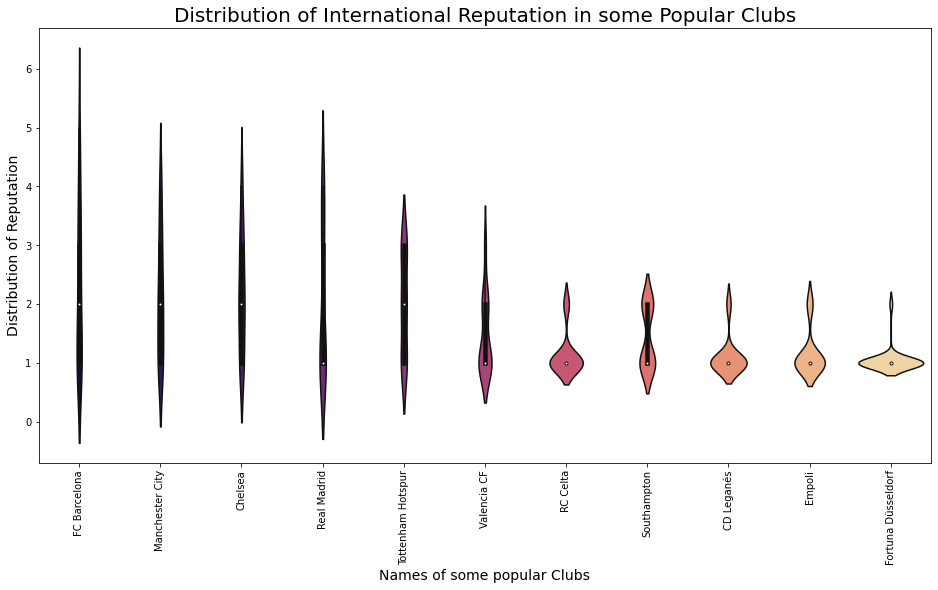

In [34]:
'''Distribution of International Reputation in some Popular clubs'''
clubs = ('CD Leganés', 'Southampton', 'RC Celta', 'Empoli', 'Fortuna Düsseldorf', 'Manchester City',
             'Tottenham Hotspur', 'FC Barcelona', 'Valencia CF', 'Chelsea', 'Real Madrid')

data_club = data.loc[data['Club'].isin(clubs) & data['International Reputation']]

plt.rcParams['figure.figsize'] = (16, 8)
ax = sns.violinplot(x = 'Club', y = 'International Reputation', data = data_club, palette = 'magma')
ax.set_xlabel(xlabel = 'Names of some popular Clubs', fontsize = 14)
ax.set_ylabel(ylabel = 'Distribution of Reputation', fontsize = 14)
ax.set_title(label = 'Distribution of International Reputation in some Popular Clubs', fontsize = 20)
plt.xticks(rotation = 90)
plt.show()

## Multivariate Analysis 

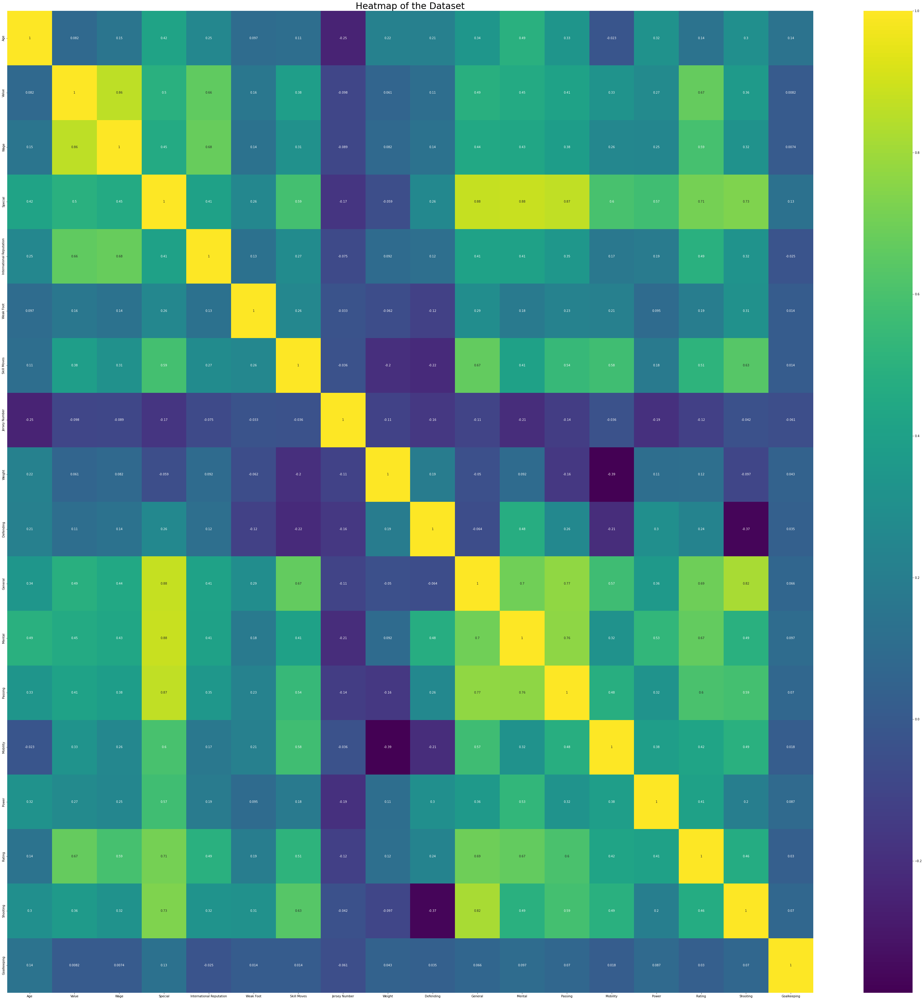

In [35]:
''' Plotting a correlation heatmap'''
plt.rcParams['figure.figsize'] = (60, 60)
sns.heatmap(data.corr(), annot = True, cmap = 'viridis')
plt.title('Heatmap of the Dataset', fontsize = 30)
plt.show()

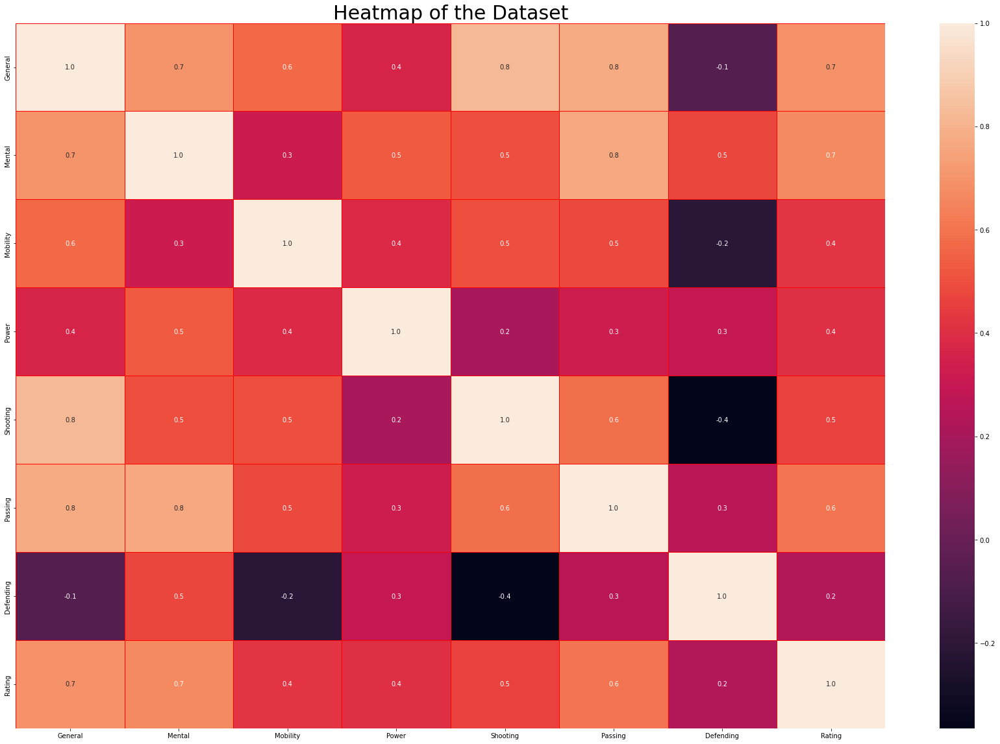

In [36]:
plt.rcParams['figure.figsize'] = (30, 20)
sns.heatmap(data[['General', 'Mental', 'Mobility', 'Power', 'Shooting',
       'Passing', 'Defending', 'Rating']].corr(), annot=True, linewidths=0.5,linecolor="red", fmt= '.1f')
plt.title('Heatmap of the Dataset', fontsize = 30)
plt.show()

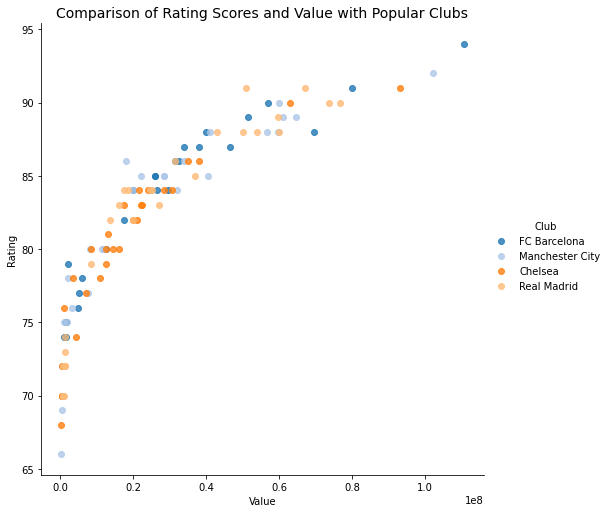

In [37]:
'''Comparison of rating scores and value with popular clubs'''
clubs = ('Manchester City', 'FC Barcelona',  'Chelsea', 'Real Madrid')

sns.lmplot(x='Value', y='Rating', hue='Club', palette =  'tab20',
           data=data.loc[data['Club'].isin(clubs)], 
           fit_reg=False, height = 7)
plt.title('Comparison of Rating Scores and Value with Popular Clubs', fontsize = 14)
plt.show()

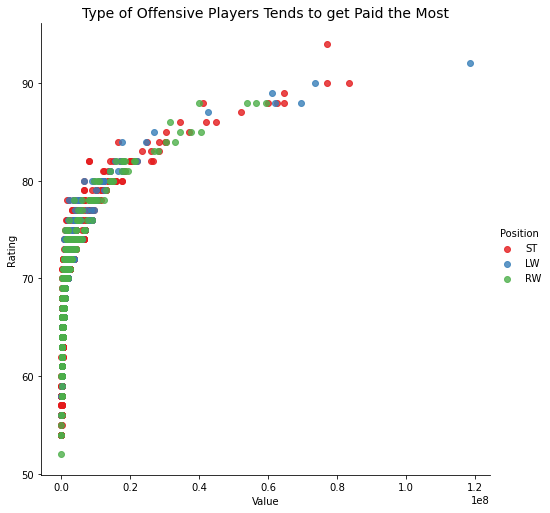

In [38]:
'''Type of Offensive Players Tends to get Paid the Most'''
sns.lmplot(x='Value', y='Rating', hue='Position', palette =  'Set1',
           data=data.loc[data['Position'].isin(['ST', 'RW', 'LW'])], 
           fit_reg=False, height = 7)
plt.title('Type of Offensive Players Tends to get Paid the Most', fontsize = 14)
plt.show()

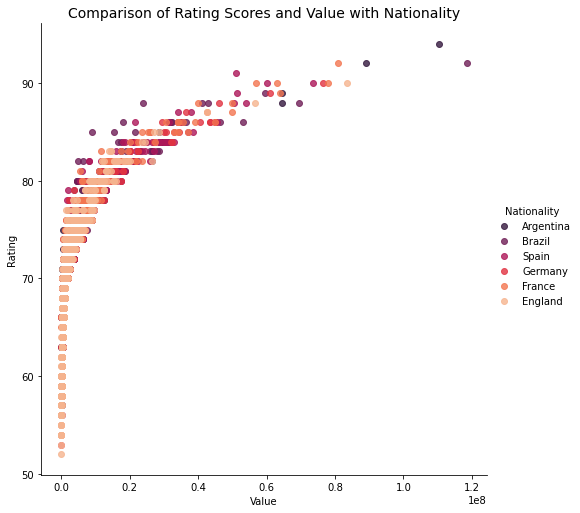

In [39]:
'''Comparison of rating scores and value with Nationality'''
countries = ('England', 'Germany', 'Spain', 'Argentina', 'France', 'Brazil')

sns.lmplot(x='Value', y='Rating', hue ='Nationality', palette =  'rocket',
           data=data.loc[data['Nationality'].isin(countries)], 
           fit_reg=False, height = 7)
plt.title('Comparison of Rating Scores and Value with Nationality', fontsize = 14)
plt.show()

C:\Users\hp\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



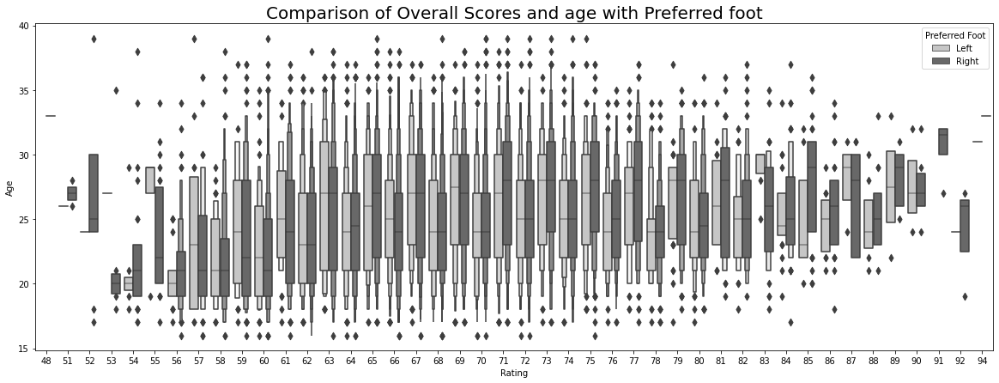

In [40]:
'''Comparison of Rating Scores and age with Preferred foot'''
plt.rcParams['figure.figsize'] = (20, 7)
plt.style.use('seaborn-dark-palette')

sns.boxenplot(data['Rating'], data['Age'], hue = data['Preferred Foot'], palette = 'Greys')
plt.title('Comparison of Overall Scores and age with Preferred foot', fontsize = 20)
plt.show()

## TOP 5 HIGHEST VALUED PLAYERS

In [41]:
data.sort_values(['Value'],ascending=False)[:5]

,Name,Age,Nationality,Club,Value,Wage,Special,Preferred Foot,International Reputation,Weak Foot,...,Release Clause,Defending,General,Mental,Passing,Mobility,Power,Rating,Shooting,Goalkeeping
2,Neymar Jr,26,Brazil,Paris Saint-Germain,118500000,290000,2143,Right,5.0,5.0,...,€228.1M,28,85,72,80,94,69,92,84,12
0,L. Messi,31,Argentina,FC Barcelona,110500000,565000,2202,Left,5.0,4.0,...,€226.5M,29,89,71,87,91,74,94,88,11
4,K. De Bruyne,27,Belgium,Manchester City,102000000,355000,2281,Right,4.0,5.0,...,€196.4M,59,79,81,92,81,76,92,85,11
5,E. Hazard,27,Belgium,Chelsea,93000000,340000,2142,Right,4.0,4.0,...,€172.1M,28,83,72,84,92,75,91,82,9
15,P. Dybala,24,Argentina,Juventus,89000000,205000,2092,Left,3.0,3.0,...,€153.5M,21,85,67,81,87,76,92,86,5


## Oldest Players

In [42]:
data.loc[data.Age >38]


,Name,Age,Nationality,Club,Value,Wage,Special,Preferred Foot,International Reputation,Weak Foot,...,Release Clause,Defending,General,Mental,Passing,Mobility,Power,Rating,Shooting,Goalkeeping
1952,P. Guiñazú,39,Argentina,Club Atlético Talleres,450000,10000,1876,Left,1.0,3.0,...,€675K,73,64,73,71,58,80,75,47,11
2225,C. Pizarro,39,Peru,SV Werder Bremen,1600000,18000,1823,Right,3.0,4.0,...,€2.8M,31,76,69,70,54,62,74,74,10
3128,D. Dainelli,39,Italy,Livorno,270000,2000,1419,Right,2.0,3.0,...,€419K,73,55,54,49,41,55,73,34,11
3420,S. Pellissier,39,Italy,Chievo Verona,900000,10000,1698,Right,2.0,4.0,...,€1.5M,28,70,60,59,52,60,72,75,8
4646,F. Cubero,39,Argentina,Vélez Sarsfield,160000,6000,1796,Right,1.0,2.0,...,€240K,71,61,67,64,60,62,71,56,11
5040,R. Braña,39,Argentina,Estudiantes de La Plata,120000,6000,1804,Right,1.0,3.0,...,€180K,71,65,69,70,51,58,70,59,11
5608,A. Bastía,39,Argentina,Club Atlético Colón,120000,5000,1855,Right,1.0,3.0,...,€180K,65,63,71,65,55,66,70,65,10
7039,Lee Dong Gook,39,Korea Republic,Jeonbuk Hyundai Motors,260000,4000,1655,Right,3.0,4.0,...,€338K,21,67,58,60,46,60,68,75,10
10534,M. Ogasawara,39,Japan,Kashima Antlers,40000,2000,1696,Right,2.0,4.0,...,€52K,63,62,64,67,46,56,65,58,10
14920,D. Bulman,39,England,Crawley Town,50000,1000,1615,Right,1.0,3.0,...,€88K,56,54,60,57,48,74,60,45,13


## Thank You